Research Ques2: How do the music genres discussed on Reddit correlate with the genres that users actually listen to on Spotify, and can we identify any trends in genre preferences from these discussions?

We want to check the discussions on music related to the genre type. So lets plot a graph on how many discusions occur on the selected subreddits related to the genre.

Plotting the graph for artists details and genres : analysis on which genre ranks more from the top hits artists details

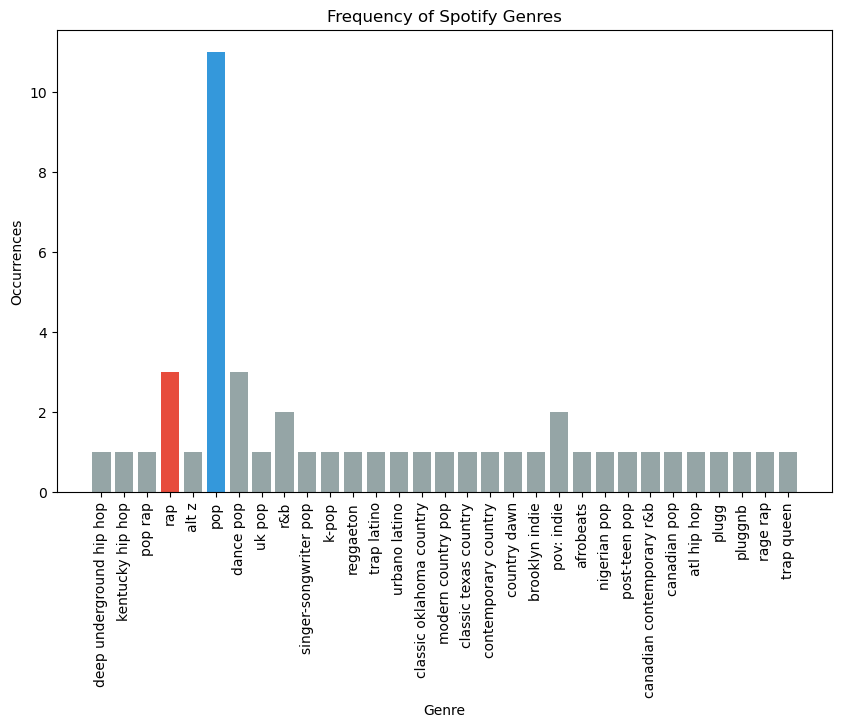

In [1]:
import matplotlib.pyplot as plt
from pymongo import MongoClient
from collections import Counter
import seaborn as sns
import plotly.express as px

client = MongoClient('mongodb://127.0.0.1:27017/')
db = client.chestnut
collection = db.artists_details

artists_details = list(collection.find())

all_genres = [genre for artist in artists_details for genre in artist.get("genres", [])]

genre_counts = Counter(all_genres)
#print(genre_counts)

colors = {'pop': '#3498db', 'rap': '#e74c3c', 'hip hop': '#2ecc71', 'country': '#f39c12'}

plt.figure(figsize=(10, 6))
bars = plt.bar(list(genre_counts.keys()), list(genre_counts.values()), color=[colors.get(genre, '#95a5a6') for genre in genre_counts.keys()])
plt.xlabel('Genre')
plt.ylabel('Occurrences')
plt.title('Frequency of Spotify Genres')
plt.xticks(rotation=90)

for bar, genre in zip(bars, genre_counts.keys()):
    color = colors.get(genre, '#95a5a6')
    #print(f'Genre: {genre}, Color: {color}')

plt.show()

fig = px.bar(
    x=list(genre_counts.keys()),
    y=list(genre_counts.values()),
    labels={'x': 'Genre', 'y': 'Occurrences'},
    title='Frequency of Spotify Genres',
    color=list(genre_counts.keys()),  
    color_discrete_map=colors
)

fig.update_layout(
    xaxis=dict(tickangle=-45, tickmode='array', tickvals=list(genre_counts.keys())),
    margin=dict(l=0, r=0, b=0, t=50),
)

fig.show()


Clearly, genres such as pop and rap rank highest in the genre list.

+---------------------------+---------------+----------------------------------------------------------------------------------------------------------------------------------+
| Genre                     |   Occurrences | Artists                                                                                                                          |
+===========================+===============+==================================================================================================================================+
| deep underground hip hop  |             1 | Jack Harlow                                                                                                                      |
+---------------------------+---------------+----------------------------------------------------------------------------------------------------------------------------------+
| kentucky hip hop          |             1 | Jack Harlow                                                          

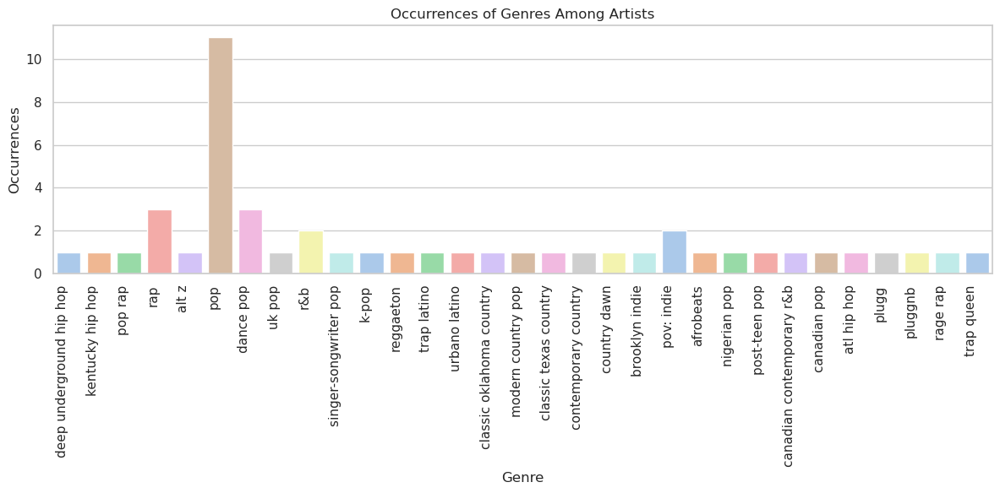

In [2]:
from pymongo import MongoClient
from collections import Counter
from tabulate import tabulate
import matplotlib.pyplot as plt
import seaborn as sns  # Import seaborn for color palette

client = MongoClient('mongodb://127.0.0.1:27017/')
db = client.chestnut
collection = db.artists_details

artists_details = list(collection.find())

all_genres = [genre for artist in artists_details for genre in artist.get("genres", [])]

genre_counts = Counter(all_genres)

most_common_genre, count = genre_counts.most_common(1)[0]

table_data = [
    (genre, count, ", ".join([artist["name"] for artist in artists_details if genre in artist.get("genres", [])]))
    for genre, count in genre_counts.items()
]

table_headers = ["Genre", "Occurrences", "Artists"]
print(tabulate(table_data, headers=table_headers, tablefmt="grid"))

genres, counts = zip(*genre_counts.items())

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
colors = sns.color_palette("pastel", len(genre_counts))
sns.barplot(x=list(genre_counts.keys()), y=list(genre_counts.values()), palette=colors)
plt.xlabel('Genre')
plt.ylabel('Occurrences')
plt.title('Occurrences of Genres Among Artists')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()


Analysis of songs and their genres in Reddit posts:



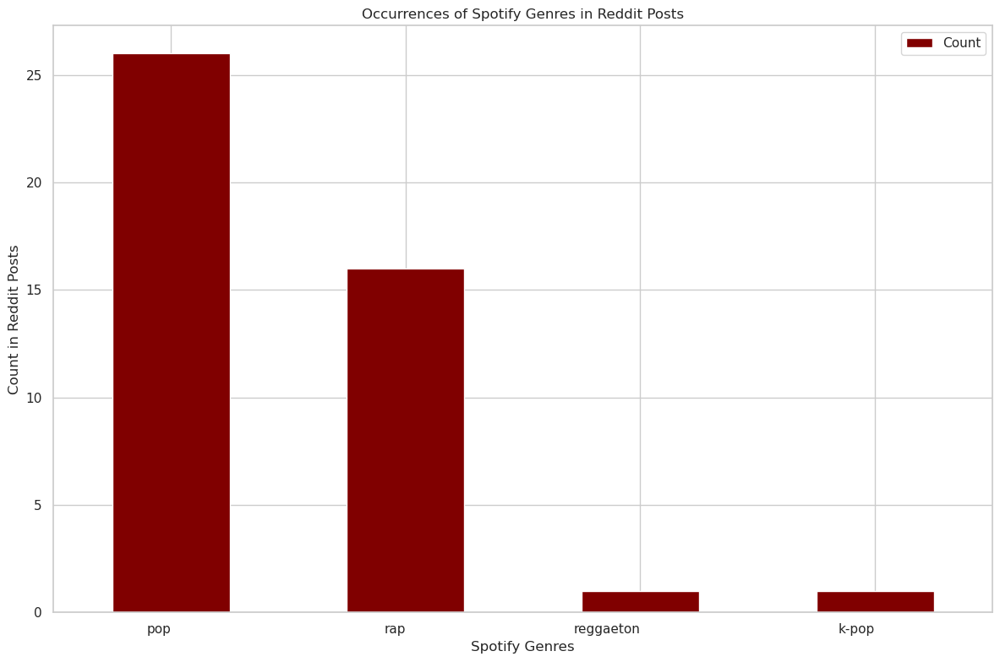

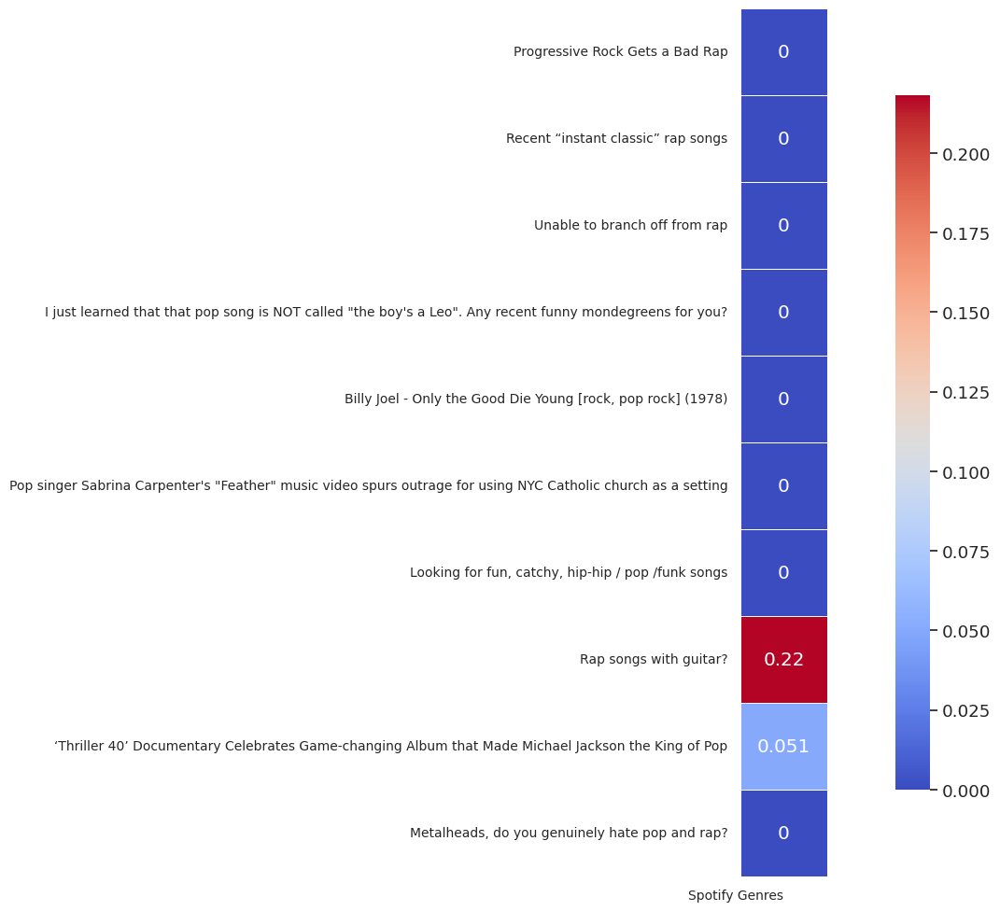

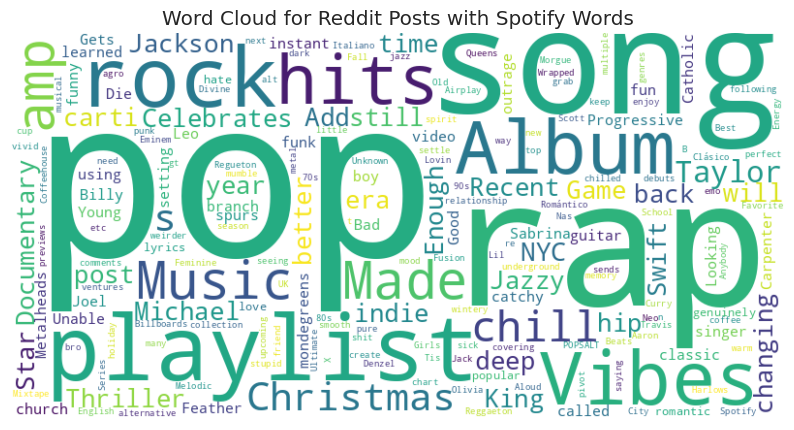

In [3]:
from collections import Counter
import matplotlib.pyplot as plt
import pandas as pd
from pymongo import MongoClient
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer
import seaborn as sns
from wordcloud import WordCloud

client = MongoClient('mongodb://127.0.0.1:27017/')
db = client.chestnut

reddit_collections = ['rMusic', 'rSpotify', 'rPopheads', 'artists_posts']
spotify_collection = db['artists_details']

reddit_posts = []
reddit_post_ids = []

for collection_name in reddit_collections:
    cursor = db[collection_name].find({}, {'post': 1, '_id': 1})
    for post in cursor:
        reddit_posts.append(post['post'])
        reddit_post_ids.append(post['_id'])

reddit_words = ' '.join(reddit_posts).lower().split()

cursor_artists = spotify_collection.find({}, {"_id": 0, "genres": 1})
spotify_genres = [genre.lower() for artist in cursor_artists for genre in artist.get("genres", [])]

spotify_text = ' '.join(spotify_genres)

vectorizer = TfidfVectorizer()
reddit_tfidf_matrix = vectorizer.fit_transform(reddit_posts)
spotify_tfidf_matrix = vectorizer.transform([' '.join(spotify_genres)])

cosine_similarities = cosine_similarity(reddit_tfidf_matrix, spotify_tfidf_matrix)

reddit_posts_with_spotify_words = [post for post in reddit_posts if any(word in post.lower().split() for word in spotify_genres)]

spotify_genre_counts = Counter(word for word in reddit_words if word in spotify_genres)

# for post in reddit_posts_with_spotify_words:
#     print(post)

spotify_genre_counts = Counter(word for word in reddit_words if word in spotify_genres)

genre_counts_df = pd.DataFrame(list(spotify_genre_counts.items()), columns=['Genre', 'Count'])
genre_counts_df = genre_counts_df.sort_values(by='Count', ascending=False)

fig, ax = plt.subplots(figsize=(12, 8))
genre_counts_df.plot(kind='bar', x='Genre', y='Count', ax=ax, color='maroon')
ax.set_xlabel('Spotify Genres')
ax.set_ylabel('Count in Reddit Posts')
ax.set_title('Occurrences of Spotify Genres in Reddit Posts')
plt.xticks(rotation=0, ha='right')
plt.tight_layout()
plt.show()

max_display = 10
subset_posts = reddit_posts_with_spotify_words[:max_display]
subset_genres = spotify_genres[:max_display]

plt.figure(figsize=(15, 10))
sns.set(font_scale=1.2)
plt.xticks(rotation=0, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
heatmap = sns.heatmap(cosine_similarities[:max_display, :], annot=True, cmap='coolwarm', xticklabels=['Spotify Genres'], yticklabels=subset_posts, linewidths=.5, square=True, cbar_kws={"shrink": 0.8})
plt.tight_layout()

wordcloud_text = ' '.join(reddit_posts_with_spotify_words)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(wordcloud_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Reddit Posts with Spotify Words')
plt.show()


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from collections import Counter
from pymongo import MongoClient
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud

# Connect to MongoDB
client = MongoClient('mongodb://127.0.0.1:27017/')
db = client.chestnut

# Fetch Reddit data
reddit_collections = ['rMusic', 'rSpotify', 'rPopheads', 'artists_posts']
reddit_posts = []
for collection_name in reddit_collections:
    cursor = db[collection_name].find({}, {'post': 1})
    for post in cursor:
        reddit_posts.append(post['post'])

spotify_collection = db['artists_details']
cursor_artists = spotify_collection.find({}, {"_id": 0, "genres": 1})
spotify_genres = [genre.lower() for artist in cursor_artists for genre in artist.get("genres", [])]

vectorizer = TfidfVectorizer()
reddit_tfidf_matrix = vectorizer.fit_transform(reddit_posts)
spotify_tfidf_matrix = vectorizer.transform([' '.join(spotify_genres)])
cosine_similarities = cosine_similarity(reddit_tfidf_matrix, spotify_tfidf_matrix)

reddit_posts_with_spotify_words = [post for post in reddit_posts if any(word in post.lower().split() for word in spotify_genres)]

spotify_genre_counts = Counter(word for word in ' '.join(reddit_posts).lower().split() if word in spotify_genres)

reddit_df = pd.DataFrame(list(spotify_genre_counts.items()), columns=['Genre', 'Count'])
spotify_df = pd.DataFrame(list(Counter(spotify_genres).items()), columns=['Genre', 'Count'])

reddit_df['Source'] = 'Reddit'
spotify_df['Source'] = 'Spotify'

combined_df = pd.concat([reddit_df, spotify_df])

fig = px.bar(
    combined_df,
    x='Genre',
    y='Count',
    color='Source',
    labels={'Count': 'Occurrences'},
    title='Frequency of Genres in Reddit and Spotify Data',
)

fig.update_layout(
    xaxis=dict(tickangle=-45, tickmode='array'),
    margin=dict(l=0, r=0, b=0, t=50),
)

fig.show()


The conslusion for this analysis is that, pop and rap genres are now leading in both the spotify top-hits as well as in reddit discussions (though reddit has a count for k-pop and latin)

                                            --------- RESEARCH QUESTION 2 DONE --------